# Генерация изображений с BigBiGAN

In [1]:
import io
import IPython.display
import PIL.Image
from pprint import pformat
import gc

import numpy as np

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

import tensorflow_hub as hub
import tensorflow_datasets as tfds

Instructions for updating:
non-resource variables are not supported in the long term


#### взято отсюда
https://www.tensorflow.org/hub/tutorials/bigbigan_with_tf_hub

Модель BigBiGAN, доступная на TF Hub.


Сначала установите путь к модулю. По умолчанию мы загружаем модель BigBiGAN с меньшим кодером на основе ResNet-50 с https://tfhub.dev/deepmind/bigbigan-resnet50/1. Чтобы загрузить большую модель на основе RevNet-50-x4, используемую для достижения наилучших результатов обучения представлению, закомментируйте активную настройку module_path и раскомментируйте другую

In [4]:
module_path = 'https://tfhub.dev/deepmind/bigbigan-resnet50/1'  # ResNet-50
# module_path = 'https://tfhub.dev/deepmind/bigbigan-revnet50x4/1'  # RevNet-50 x4

## Setup

#### функции для отображения изображений

In [2]:
def imgrid(imarray, cols=4, pad=1, padval=255, row_major=True):
    """Lays out a [N, H, W, C] image array as a single image grid."""
    pad = int(pad)
    if pad < 0:
        raise ValueError('pad must be non-negative')
    cols = int(cols)
    assert cols >= 1
    N, H, W, C = imarray.shape
    rows = N // cols + int(N % cols != 0)
    batch_pad = rows * cols - N
    assert batch_pad >= 0
    post_pad = [batch_pad, pad, pad, 0]
    pad_arg = [[0, p] for p in post_pad]
    imarray = np.pad(imarray, pad_arg, 'constant', constant_values=padval)
    H += pad
    W += pad
    grid = (imarray
          .reshape(rows, cols, H, W, C)
          .transpose(0, 2, 1, 3, 4)
          .reshape(rows*H, cols*W, C))
    if pad:
        grid = grid[:-pad, :-pad]
    return grid

def interleave(*args):
    """Interleaves input arrays of the same shape along the batch axis."""
    if not args:
        raise ValueError('At least one argument is required.')
    a0 = args[0]
    if any(a.shape != a0.shape for a in args):
        raise ValueError('All inputs must have the same shape.')
    if not a0.shape:
        raise ValueError('Inputs must have at least one axis.')
    out = np.transpose(args, [1, 0] + list(range(2, len(a0.shape) + 1)))
    out = out.reshape(-1, *a0.shape[1:])
    return out

def imshow(a, format='png', jpeg_fallback=True):
    """Displays an image in the given format."""
    a = a.astype(np.uint8)
    data = io.BytesIO()
    PIL.Image.fromarray(a).save(data, format)
    im_data = data.getvalue()
    try:
        disp = IPython.display.display(IPython.display.Image(im_data))
    except IOError:
        if jpeg_fallback and format != 'jpeg':
                
            print ('Warning: image was too large to display in format "{}"; '
             'trying jpeg instead.').format(format)
            return imshow(a, format='jpeg')
        else:
            raise
    return disp

def image_to_uint8(x):
    """Converts [-1, 1] float array to [0, 255] uint8."""
    x = np.asarray(x)
    x = (256. / 2.) * (x + 1.)
    x = np.clip(x, 0, 255)
    x = x.astype(np.uint8)
    return x

### Загрузка модуля BigBiGAN TF Hub и отображение его доступных функций

In [6]:
# module = hub.Module(module_path, trainable=True, tags={'train'})  # training
module = hub.Module(module_path)  # inference

for signature in module.get_signature_names():
    print('Signature:', signature)
    print('Inputs:', pformat(module.get_input_info_dict(signature)))
    print('Outputs:', pformat(module.get_output_info_dict(signature)))
    print()

Signature: generate
Inputs: {'z': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>}
Outputs: {'default': <hub.ParsedTensorInfo shape=(?, 128, 128, 3) dtype=float32 is_sparse=False>,
 'upsampled': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}

Signature: default
Inputs: {'x': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}
Outputs: {'default': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>}

Signature: encode
Inputs: {'x': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}
Outputs: {'avepool_feat': <hub.ParsedTensorInfo shape=(?, 2048) dtype=float32 is_sparse=False>,
 'bn_crelu_feat': <hub.ParsedTensorInfo shape=(?, 4096) dtype=float32 is_sparse=False>,
 'default': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>,
 'z_mean': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>,
 'z_sample': <hub.ParsedTensorInfo shape=(?, 120) dt

#### Определение класса-оболочки для удобного доступа к различным функциям

In [3]:
class BigBiGAN(object):

    def __init__(self, module):
        """Initialize a BigBiGAN from the given TF Hub module."""
        self._module = module

    def generate(self, z, upsample=False):
        """Run a batch of latents z through the generator to generate images.

        Args:
          z: A batch of 120D Gaussian latents, shape [N, 120].

        Returns: a batch of generated RGB images, shape [N, 128, 128, 3], range
          [-1, 1].
        """
        outputs = self._module(z, signature='generate', as_dict=True)
        return outputs['upsampled' if upsample else 'default']

    def make_generator_ph(self):
        """Creates a tf.placeholder with the dtype & shape of generator inputs."""
        info = self._module.get_input_info_dict('generate')['z']
        return tf.placeholder(dtype=info.dtype, shape=info.get_shape())

    def gen_pairs_for_disc(self, z):
        """Compute generator input pairs (G(z), z) for discriminator, given z.

        Args:
          z: A batch of latents (120D standard Gaussians), shape [N, 120].

        Returns: a tuple (G(z), z) of discriminator inputs.
        """
    # Downsample 256x256 image x for 128x128 discriminator input.
        x = self.generate(z)
        return x, z

    def encode(self, x, return_all_features=False):
        """Run a batch of images x through the encoder.

        Args:
          x: A batch of data (256x256 RGB images), shape [N, 256, 256, 3], range
            [-1, 1].
          return_all_features: If True, return all features computed by the encoder.
            Otherwise (default) just return a sample z_hat.

        Returns: the sample z_hat of shape [N, 120] (or a dict of all features if
          return_all_features).
        """
        outputs = self._module(x, signature='encode', as_dict=True)
        return outputs if return_all_features else outputs['z_sample']

    def make_encoder_ph(self):
        """Creates a tf.placeholder with the dtype & shape of encoder inputs."""
        info = self._module.get_input_info_dict('encode')['x']
        return tf.placeholder(dtype=info.dtype, shape=info.get_shape())

    def enc_pairs_for_disc(self, x):
        """Compute encoder input pairs (x, E(x)) for discriminator, given x.

        Args:
          x: A batch of data (256x256 RGB images), shape [N, 256, 256, 3], range
            [-1, 1].

        Returns: a tuple (downsample(x), E(x)) of discriminator inputs.
        """
    # Downsample 256x256 image x for 128x128 discriminator input.
        x_down = tf.nn.avg_pool(x, ksize=2, strides=2, padding='SAME')
        z = self.encode(x)
        return x_down, z

    def discriminate(self, x, z):
        """Compute the discriminator scores for pairs of data (x, z).

        (x, z) must be batches with the same leading batch dimension, and joint
          scores are computed on corresponding pairs x[i] and z[i].

        Args:
          x: A batch of data (128x128 RGB images), shape [N, 128, 128, 3], range
            [-1, 1].
          z: A batch of latents (120D standard Gaussians), shape [N, 120].

        Returns:
          A dict of scores:
            score_xz: the joint scores for the (x, z) pairs.
            score_x: the unary scores for x only.
            score_z: the unary scores for z only.
        """
        inputs = dict(x=x, z=z)
        return self._module(inputs, signature='discriminate', as_dict=True)

    def reconstruct_x(self, x, use_sample=True, upsample=False):
        """Compute BigBiGAN reconstructions of images x via G(E(x)).

        Args:
          x: A batch of data (256x256 RGB images), shape [N, 256, 256, 3], range
            [-1, 1].
           use_sample: takes a sample z_hat ~ E(x). Otherwise, deterministically
            use the mean. (Though a sample z_hat may be far from the mean z,
            typically the resulting recons G(z_hat) and G(z) are very
            similar.
          upsample: if set, upsample the reconstruction to the input resolution
            (256x256). Otherwise return the raw lower resolution generator output
            (128x128).

        Returns: a batch of recons G(E(x)), shape [N, 256, 256, 3] if
          `upsample`, otherwise [N, 128, 128, 3].
        """
        if use_sample:
            z = self.encode(x)
        else:
            z = self.encode(x, return_all_features=True)['z_mean']
        recons = self.generate(z, upsample=upsample)
        return recons

    def losses(self, x, z):
        """Compute per-module BigBiGAN losses given data & latent sample batches.

        Args:
          x: A batch of data (256x256 RGB images), shape [N, 256, 256, 3], range
            [-1, 1].
          z: A batch of latents (120D standard Gaussians), shape [M, 120].

        For the original BigBiGAN losses, pass batches of size N=M=2048, with z's
        sampled from a 120D standard Gaussian (e.g., np.random.randn(2048, 120)),
        and x's sampled from the ImageNet (ILSVRC2012) training set with the
        "ResNet-style" preprocessing from:

            https://github.com/tensorflow/tpu/blob/master/models/official/resnet/resnet_preprocessing.py

        Returns:
          A dict of per-module losses:
            disc: loss for the discriminator.
            enc: loss for the encoder.
            gen: loss for the generator.
        """
    # Compute discriminator scores on (x, E(x)) pairs.
    # Downsample 256x256 image x for 128x128 discriminator input.
        scores_enc_x_dict = self.discriminate(*self.enc_pairs_for_disc(x))
        scores_enc_x = tf.concat([scores_enc_x_dict['score_xz'],
                              scores_enc_x_dict['score_x'],
                              scores_enc_x_dict['score_z']], axis=0)

    # Compute discriminator scores on (G(z), z) pairs.
        scores_gen_z_dict = self.discriminate(*self.gen_pairs_for_disc(z))
        scores_gen_z = tf.concat([scores_gen_z_dict['score_xz'],
                              scores_gen_z_dict['score_x'],
                              scores_gen_z_dict['score_z']], axis=0)

        disc_loss_enc_x = tf.reduce_mean(tf.nn.relu(1. - scores_enc_x))
        disc_loss_gen_z = tf.reduce_mean(tf.nn.relu(1. + scores_gen_z))
        disc_loss = disc_loss_enc_x + disc_loss_gen_z

        enc_loss = tf.reduce_mean(scores_enc_x)
        gen_loss = tf.reduce_mean(-scores_gen_z)

        return dict(disc=disc_loss, enc=enc_loss, gen=gen_loss)

#### Создание тензоров для последующего использования для вычисления выборок, реконструкций, оценок дискриминаторов и потерь

In [9]:
bigbigan = BigBiGAN(module)

# Make input placeholders for x (`enc_ph`) and z (`gen_ph`).
enc_ph = bigbigan.make_encoder_ph()
gen_ph = bigbigan.make_generator_ph()

# Compute samples G(z) from encoder input z (`gen_ph`).
gen_samples = bigbigan.generate(gen_ph)

# Compute reconstructions G(E(x)) of encoder input x (`enc_ph`).
recon_x = bigbigan.reconstruct_x(enc_ph, upsample=True)

# Compute encoder features used for representation learning evaluations given
# encoder input x (`enc_ph`).
enc_features = bigbigan.encode(enc_ph, return_all_features=True)

# Compute discriminator scores for encoder pairs (x, E(x)) given x (`enc_ph`)
# and generator pairs (G(z), z) given z (`gen_ph`).
disc_scores_enc = bigbigan.discriminate(*bigbigan.enc_pairs_for_disc(enc_ph))
disc_scores_gen = bigbigan.discriminate(*bigbigan.gen_pairs_for_disc(gen_ph))

# Compute losses.
losses = bigbigan.losses(enc_ph, gen_ph)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [10]:
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

## Образцы генератора

Сначала мы визуализируем выборки из предварительно обученного генератора BigBiGAN путем выборки входов генератора z из стандартного гауссова (через np.random.randn) и отображения изображений, которые он производит. До сих пор мы не выходили за пределы возможностей стандартной GAN - мы пока просто используем генератор (и игнорируем кодировщик).

samples shape: (32, 128, 128, 3)


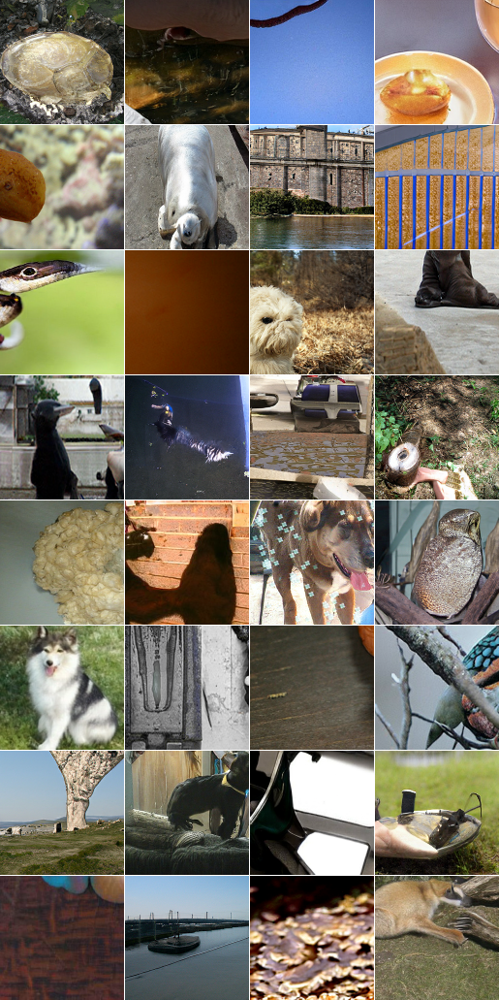

In [11]:
feed_dict = {gen_ph: np.random.randn(32, 120)}
_out_samples = sess.run(gen_samples, feed_dict=feed_dict)
print('samples shape:', _out_samples.shape)
imshow(imgrid(image_to_uint8(_out_samples), cols=4))

#### Загрузить test_images из набора данных TF-Flowers
BigBiGAN обучается работе с ImageNet, но поскольку он слишком большой для работы в этой демонстрации, мы используем меньший набор данных TF-Flowers [1] в качестве входных данных для визуализации реконструкций и функций вычислительного кодера.

В эту ячейку мы загружаем TF-Flowers (при необходимости загружая набор данных) и сохраняем фиксированную серию образцов изображения 256x256 RGB в массиве NumPy test_images.

[1] https://www.tensorflow.org/datasets/catalog/tf_flowers

In [4]:
def get_flowers_data():
    """Returns a [32, 256, 256, 3] np.array of preprocessed TF-Flowers samples."""

    ds, info = tfds.load('tf_flowers', split='train', with_info=True)

    # Just get the images themselves as we don't need labels for this demo.
    ds = ds.map(lambda x: x['image'])

    # Filter out small images (with minor edge length <256).
    ds = ds.filter(lambda x: tf.reduce_min(tf.shape(x)[:2]) >= 256)

    # Take the center square crop of the image and resize to 256x256.
    def crop_and_resize(image):
        imsize = tf.shape(image)[:2]
        minor_edge = tf.reduce_min(imsize)
        start = (imsize - minor_edge) // 2
        stop = start + minor_edge
        cropped_image = image[start[0] : stop[0], start[1] : stop[1]]
        resized_image = tf.image.resize_bicubic([cropped_image], [256, 256])[0]
        return resized_image
    ds = ds.map(crop_and_resize)

    # Convert images from [0, 255] uint8 to [-1, 1] float32.
    ds = ds.map(lambda image: tf.cast(image, tf.float32) / (255. / 2.) - 1)
 
    # Take the first 32 samples.
    ds = ds.take(32)

    return np.array(list(tfds.as_numpy(ds)))

test_images = get_flowers_data()

## Визуализация реконструкций
Теперь мы визуализируем реконструкции BigBiGAN, пропуская реальные изображения через кодировщик и обратно через генератор, вычисляя G (E (x)) для заданных изображений x. Ниже входные изображения x показаны в левом столбце, а соответствующие реконструкции показаны справа.

Обратите внимание, что реконструкции не являются идеальными совпадениями по пикселям с входными изображениями; скорее, они имеют тенденцию захватывать семантическое содержание входных данных более высокого уровня, в то же время «забывая» большинство деталей низкого уровня. Это говорит о том, что кодировщик BigBiGAN может научиться фиксировать типы семантической информации высокого уровня об изображениях, которые мы хотели бы видеть в подходе к обучению представлению.

Также обратите внимание, что необработанные реконструкции входных изображений 256x256 имеют более низкое разрешение, полученное нашим генератором - 128x128. Мы опробуем их для целей визуализации.

reconstructions shape: (32, 256, 256, 3)
inputs_and_recons shape: (64, 256, 256, 3)


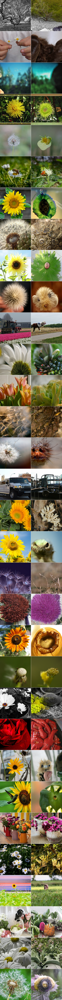

In [19]:
test_images_batch = test_images[:64]
_out_recons = sess.run(recon_x, feed_dict={enc_ph: test_images_batch})
print('reconstructions shape:', _out_recons.shape)

inputs_and_recons = interleave(test_images_batch, _out_recons)
print('inputs_and_recons shape:', inputs_and_recons.shape)
imshow(imgrid(image_to_uint8(inputs_and_recons), cols=2))

#### Особенности кодировщика
Теперь мы покажем, как вычислить функции из кодировщика, используемого для стандартных оценок обучения представлению.

Эти признаки могут быть использованы в линейном или ближайшем соседнем классификаторе. Мы включили стандартную функцию, взятую после глобального среднего пула (ключ avepool_feat), а также большую функцию "BN + CReLU" (ключ bn_crelu_feat), используемую для достижения наилучших результатов.

In [15]:
_out_features = sess.run(enc_features, feed_dict={enc_ph: test_images_batch})
print('AvePool features shape:', _out_features['avepool_feat'].shape)
print('BN+CReLU features shape:', _out_features['bn_crelu_feat'].shape)

AvePool features shape: (16, 2048)
BN+CReLU features shape: (16, 4096)


## Дискриминатор оценки и потери
Наконец, мы вычислим оценки и потери дискриминатора для пакетов пар кодера и генератора. Эти потери могут быть переданы в оптимизатор для обучения BigBiGAN.

Мы используем наш пакет изображений выше в качестве входных данных кодера x, вычисляя оценку кодера как D (x, E (x)). Для входов генератора мы выбираем z из стандартного гауссиана 120D через np.random.randn, вычисляя оценку генератора как D (G (z), z).

Дискриминатор предсказывает совместную оценку Score_xz для пар (x, z), а также унарные оценки Score_x и Score_z только для x и z соответственно. Он обучен давать высокие (положительные) оценки парам энкодеров и низкие (отрицательные) оценки парам генераторов. Это в основном выполняется ниже, хотя унарный счетчик_z в обоих случаях отрицателен, что указывает на то, что выходные сигналы кодера E (x) напоминают фактические выборки из гауссианы.

In [ ]:
feed_dict = {enc_ph: test_images, gen_ph: np.random.randn(32, 120)}
_out_scores_enc, _out_scores_gen, _out_losses = sess.run(
    [disc_scores_enc, disc_scores_gen, losses], feed_dict=feed_dict)
print('Encoder scores:', {k: v.mean() for k, v in _out_scores_enc.items()})
print('Generator scores:', {k: v.mean() for k, v in _out_scores_gen.items()})
print('Losses:', _out_losses)

In [23]:
gc.collect()

260

## Сравним с версией bigbigan-revnet50x4

In [5]:
# module_path = 'https://tfhub.dev/deepmind/bigbigan-resnet50/1'  # ResNet-50
module_path_mob = 'https://tfhub.dev/deepmind/bigbigan-revnet50x4/1'  # RevNet-50 x4

In [6]:
module_mob = hub.Module(module_path_mob)  # inference

for signature in module_mob.get_signature_names():
    print('Signature:', signature)
    print('Inputs:', pformat(module_mob.get_input_info_dict(signature)))
    print('Outputs:', pformat(module_mob.get_output_info_dict(signature)))
    print()

Signature: generate
Inputs: {'z': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>}
Outputs: {'default': <hub.ParsedTensorInfo shape=(?, 128, 128, 3) dtype=float32 is_sparse=False>,
 'upsampled': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}

Signature: default
Inputs: {'x': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}
Outputs: {'default': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>}

Signature: encode
Inputs: {'x': <hub.ParsedTensorInfo shape=(?, 256, 256, 3) dtype=float32 is_sparse=False>}
Outputs: {'avepool_feat': <hub.ParsedTensorInfo shape=(?, 8192) dtype=float32 is_sparse=False>,
 'bn_crelu_feat': <hub.ParsedTensorInfo shape=(?, 16384) dtype=float32 is_sparse=False>,
 'default': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>,
 'z_mean': <hub.ParsedTensorInfo shape=(?, 120) dtype=float32 is_sparse=False>,
 'z_sample': <hub.ParsedTensorInfo shape=(?, 120) d

In [11]:
bigbigan = BigBiGAN(module_mob)

# Make input placeholders for x (`enc_ph`) and z (`gen_ph`).
enc_ph = bigbigan.make_encoder_ph()
gen_ph = bigbigan.make_generator_ph()

# Compute samples G(z) from encoder input z (`gen_ph`).
gen_samples = bigbigan.generate(gen_ph)

# Compute reconstructions G(E(x)) of encoder input x (`enc_ph`).
recon_x = bigbigan.reconstruct_x(enc_ph, upsample=True)

# Compute encoder features used for representation learning evaluations given
# encoder input x (`enc_ph`).
enc_features = bigbigan.encode(enc_ph, return_all_features=True)

# Compute discriminator scores for encoder pairs (x, E(x)) given x (`enc_ph`)
# and generator pairs (G(z), z) given z (`gen_ph`).
disc_scores_enc = bigbigan.discriminate(*bigbigan.enc_pairs_for_disc(enc_ph))
disc_scores_gen = bigbigan.discriminate(*bigbigan.gen_pairs_for_disc(gen_ph))

# Compute losses.
losses = bigbigan.losses(enc_ph, gen_ph)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [12]:
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

samples shape: (32, 128, 128, 3)


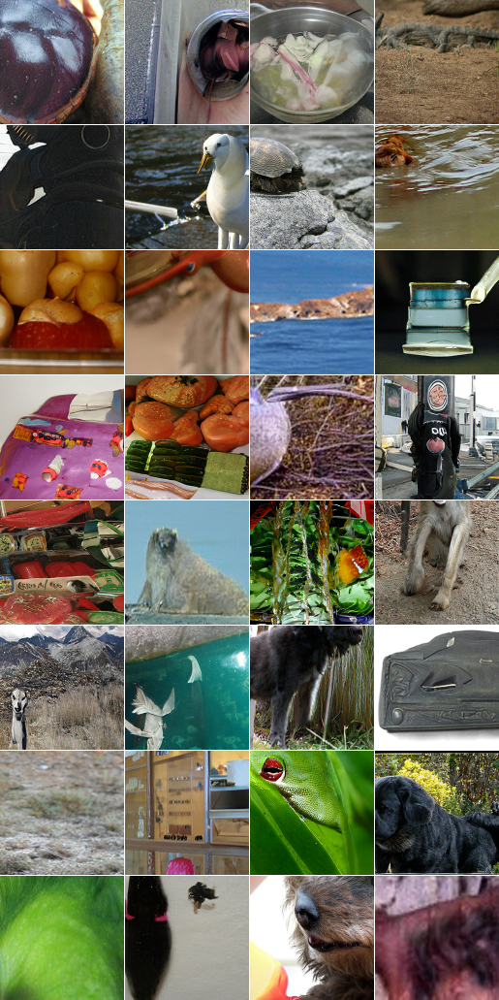

In [9]:
feed_dict = {gen_ph: np.random.randn(32, 120)}
_out_samples = sess.run(gen_samples, feed_dict=feed_dict)
print('samples shape:', _out_samples.shape)
imshow(imgrid(image_to_uint8(_out_samples), cols=4))

samples shape: (32, 128, 128, 3)


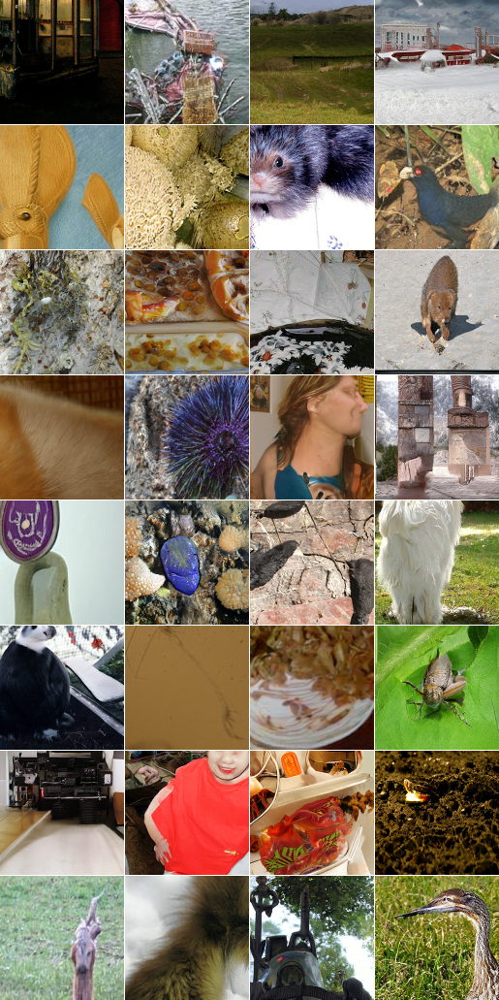

In [13]:
feed_dict = {gen_ph: np.random.randn(32, 120)}
_out_samples = sess.run(gen_samples, feed_dict=feed_dict)
print('samples shape:', _out_samples.shape)
imshow(imgrid(image_to_uint8(_out_samples), cols=4))

In [14]:
test_images = get_flowers_data()

In [15]:
gc.collect()

245

### Визуализация реконструкций

In [12]:
test_images_batch = test_images[:32]
_out_recons = sess.run(recon_x, feed_dict={enc_ph: test_images_batch})
print('reconstructions shape:', _out_recons.shape)

inputs_and_recons = interleave(test_images_batch, _out_recons)
print('inputs_and_recons shape:', inputs_and_recons.shape)
imshow(imgrid(image_to_uint8(inputs_and_recons), cols=2))

ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted: OOM when allocating tensor with shape[32768,130,130] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[node module_apply_encode/Encoder/GenEncWrapper/Encoder/get_features/resnet_v2/root/Pad_1 (defined at C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_hub\native_module.py:610) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[module_apply_generate_1/Generator/Tanh-0-0-TransposeNCHWToNHWC-LayoutOptimizer/_1657]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted: OOM when allocating tensor with shape[32768,130,130] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[node module_apply_encode/Encoder/GenEncWrapper/Encoder/get_features/resnet_v2/root/Pad_1 (defined at C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_hub\native_module.py:610) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored.

Original stack trace for 'module_apply_encode/Encoder/GenEncWrapper/Encoder/get_features/resnet_v2/root/Pad_1':
  File "C:\Users\37529\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\37529\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\37529\Anaconda3\lib\site-packages\traitlets\config\application.py", line 664, in launch_instance
    app.start()
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 597, in start
    self.io_loop.start()
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\platform\asyncio.py", line 149, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\37529\Anaconda3\lib\asyncio\base_events.py", line 541, in run_forever
    self._run_once()
  File "C:\Users\37529\Anaconda3\lib\asyncio\base_events.py", line 1786, in _run_once
    handle._run()
  File "C:\Users\37529\Anaconda3\lib\asyncio\events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\ioloop.py", line 690, in <lambda>
    lambda f: self._run_callback(functools.partial(callback, future))
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\ioloop.py", line 743, in _run_callback
    ret = callback()
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 787, in inner
    self.run()
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 748, in run
    yielded = self.gen.send(value)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 381, in dispatch_queue
    yield self.process_one()
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 225, in wrapper
    runner = Runner(result, future, yielded)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 714, in __init__
    self.run()
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 748, in run
    yielded = self.gen.send(value)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 365, in process_one
    yield gen.maybe_future(dispatch(*args))
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 209, in wrapper
    yielded = next(result)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 268, in dispatch_shell
    yield gen.maybe_future(handler(stream, idents, msg))
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 209, in wrapper
    yielded = next(result)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 545, in execute_request
    user_expressions, allow_stdin,
  File "C:\Users\37529\Anaconda3\lib\site-packages\tornado\gen.py", line 209, in wrapper
    yielded = next(result)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 300, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "C:\Users\37529\Anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 536, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2858, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2886, in _run_cell
    return runner(coro)
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\async_helpers.py", line 68, in _pseudo_sync_runner
    coro.send(None)
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3063, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3254, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\Users\37529\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-7-da2e554757ff>", line 11, in <module>
    recon_x = bigbigan.reconstruct_x(enc_ph, upsample=True)
  File "<ipython-input-3-f4778fa8aed2>", line 108, in reconstruct_x
    z = self.encode(x)
  File "<ipython-input-3-f4778fa8aed2>", line 48, in encode
    outputs = self._module(x, signature='encode', as_dict=True)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_hub\module.py", line 261, in __call__
    name=name)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_hub\native_module.py", line 610, in create_apply_graph
    import_scope=relative_scope_name)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\training\saver.py", line 1453, in import_meta_graph
    **kwargs)[0]
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\training\saver.py", line 1477, in _import_meta_graph_with_return_elements
    **kwargs))
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\meta_graph.py", line 797, in import_scoped_meta_graph_with_return_elements
    return_elements=return_elements)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\util\deprecation.py", line 507, in new_func
    return func(*args, **kwargs)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\importer.py", line 405, in import_graph_def
    producer_op_list=producer_op_list)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\importer.py", line 513, in _import_graph_def_internal
    _ProcessNewOps(graph)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\importer.py", line 243, in _ProcessNewOps
    for new_op in graph._add_new_tf_operations(compute_devices=False):  # pylint: disable=protected-access
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\ops.py", line 3459, in _add_new_tf_operations
    for c_op in c_api_util.new_tf_operations(self)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\ops.py", line 3459, in <listcomp>
    for c_op in c_api_util.new_tf_operations(self)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\ops.py", line 3347, in _create_op_from_tf_operation
    ret = Operation(c_op, self)
  File "C:\Users\37529\Anaconda3\lib\site-packages\tensorflow_core\python\framework\ops.py", line 1756, in __init__
    self._traceback = tf_stack.extract_stack()


In [16]:
gc.collect()

20

## Выводы

Модель генерирует довольно интересные изображения со скрытой ассоциацией с исходным.
Понравились: трактор - фигура лошади. Одуванчик - мордочка хомячка)))


Требуются достаточные вычислитетельные мощности для работы с моделями.

